In [1]:
%cd "COVID-19" 
!pwd
#| pwd
#!pwd
!git pull origin master
%cd ".."
!pwd

From https://github.com/CSSEGISandData/COVID-19
 * branch              master     -> FETCH_HEAD
Already up to date.
/home/julsoles/Documents/covid_data_science/data
/home/julsoles/Documents/covid_data_science/data


In [2]:
!pip install keras

In [3]:
import folium
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import pandas 
import seaborn as sns
from IPython.display import display
import datetime
#from datetime import datetime
import plotly.express as px

from keras import models


import os
from pathlib import Path

Using TensorFlow backend.
/home/julsoles/.local/lib/python3.7/site-packages/tensorflow/python/framework/dtypes.py:516: FutureWarning:

Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.

/home/julsoles/.local/lib/python3.7/site-packages/tensorflow/python/framework/dtypes.py:517: FutureWarning:

Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.

/home/julsoles/.local/lib/python3.7/site-packages/tensorflow/python/framework/dtypes.py:518: FutureWarning:

Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.

/home/julsoles/.local/lib/python3.7/site-packages/tensorflow/python/framework/dtypes.py:519: FutureWarning:

Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy,

In [4]:
curr_folder = Path(os.getcwd())
print(curr_folder)

/home/julsoles/Documents/covid_data_science/data


In [5]:
data_folder = os.path.join(curr_folder, 'COVID-19', 'csse_covid_19_data', 'csse_covid_19_time_series')

today_date = datetime.date.today()
yesterday = today_date - datetime.timedelta(days=1)
yesterday = yesterday.strftime('%m/%d/%Y')

# temporal 
yesterday = today_date.strftime('%m/%d/%Y')

display(yesterday)

last_seven_days = today_date - datetime.timedelta(days=7)
last_seven_days = last_seven_days.strftime('%m/%d/%Y')
display(last_seven_days)

'05/06/2020'

'04/29/2020'

In [6]:
def new_infection_computer(infection_df):
    
    new_infection_df = infection_df.copy().filter(['Province/State', 'Country/Region', 'Lat', 'Long'])
    list_to_skip = ['Province/State', 'Country/Region', 'Lat', 'Long']
    
    prev = infection_df.loc[:,'1/22/20']
    for (columnName, columnData) in infection_df.iteritems():
        if columnName in list_to_skip:
            continue
        else:
            new_infection_df[columnName] = columnData.subtract(prev, fill_value=0)
            prev = columnData
    
    return new_infection_df

def five_day_moving_average(orig_df):
    
    mv_avg_df = orig_df.copy().filter(['Province/State', 'Country/Region', 'Lat', 'Long'])
    list_to_skip = ['Province/State', 'Country/Region', 'Lat', 'Long']
    
    dates_list = []
    
    for (columnName, columnData) in orig_df.iteritems():
        if columnName in list_to_skip:
            continue
        else:
            dates_list.append(columnData)
            if len(dates_list) == 5:
                mv_avg_df[columnName] = sum(dates_list)/5
                dates_list.pop(0)
            else:
                continue
    
    return mv_avg_df

In [7]:
covid_19_confirmed_orig = pd.read_csv(os.path.join(data_folder, 'time_series_covid19_confirmed_global.csv'))
display(covid_19_confirmed_orig)
covid_19_deaths_orig = pd.read_csv(os.path.join(data_folder, 'time_series_covid19_deaths_global.csv'))
covid_19_recovered_orig = pd.read_csv(os.path.join(data_folder, 'time_series_covid19_recovered_global.csv'))


covid_19_infections_per_day_orig = new_infection_computer(covid_19_confirmed_orig)
#covid_19_confirmed_mv_avg = five_day_moving_average(covid_19_confirmed_orig)
#covid_19_deaths_mv_avg = five_day_moving_average(covid_19_confirmed_orig)
covid_19_infections_mv_avg = five_day_moving_average(covid_19_infections_per_day_orig)

,Province/State,Country/Region,Lat,Long,1/22/20,1/23/20,1/24/20,1/25/20,1/26/20,1/27/20,...,4/27/20,4/28/20,4/29/20,4/30/20,5/1/20,5/2/20,5/3/20,5/4/20,5/5/20,5/6/20
0,NaN,Afghanistan,33.000000,65.000000,0,0,0,0,0,0,...,1703,1828,1939,2171,2335,2469,2704,2894,3224,3392
1,NaN,Albania,41.153300,20.168300,0,0,0,0,0,0,...,736,750,766,773,782,789,795,803,820,832
2,NaN,Algeria,28.033900,1.659600,0,0,0,0,0,0,...,3517,3649,3848,4006,4154,4295,4474,4648,4838,4997
3,NaN,Andorra,42.506300,1.521800,0,0,0,0,0,0,...,743,743,743,745,745,747,748,750,751,751
4,NaN,Angola,-11.202700,17.873900,0,0,0,0,0,0,...,27,27,27,27,30,35,35,35,36,36
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
261,NaN,Western Sahara,24.215500,-12.885800,0,0,0,0,0,0,...,6,6,6,6,6,6,6,6,6,6
262,NaN,Sao Tome and Principe,0.186360,6.613081,0,0,0,0,0,0,...,4,8,8,14,16,16,16,23,174,174
263,NaN,Yemen,15.552727,48.516388,0,0,0,0,0,0,...,1,1,6,6,7,10,10,12,22,25
264,NaN,Comoros,-11.645500,43.333300,0,0,0,0,0,0,...,0,0,0,1,1,3,3,3,3,8


In [8]:
## Preprocessing of world data

covid_19_confirmed_orig.columns = ['Province', 'Country', 'Lat', 'Long'] + pd.to_datetime(covid_19_confirmed_orig.columns[4:]).strftime('%m/%d/%Y').to_list()
covid_19_deaths_orig.columns = ['Province', 'Country', 'Lat', 'Long'] + pd.to_datetime(covid_19_deaths_orig.columns[4:]).strftime('%m/%d/%Y').to_list()
covid_19_recovered_orig.columns = ['Province', 'Country', 'Lat', 'Long'] + pd.to_datetime(covid_19_recovered_orig.columns[4:]).strftime('%m/%d/%Y').to_list()

covid_19_infections_per_day_orig.columns = ['Province', 'Country', 'Lat', 'Long'] + pd.to_datetime(covid_19_infections_per_day_orig.columns[4:]).strftime('%m/%d/%Y').to_list()
covid_19_infections_mv_avg.columns = ['Province', 'Country', 'Lat', 'Long'] + pd.to_datetime(covid_19_infections_mv_avg.columns[4:]).strftime('%m/%d/%Y').to_list()

## World confirmed, deaths, recovered data per country including latitude and longitude
covid_19_confirmed_country = covid_19_confirmed_orig.copy().groupby('Country').sum()
covid_19_deaths_country = covid_19_deaths_orig.copy().groupby('Country').sum()
covid_19_recovered_country = covid_19_recovered_orig.copy().groupby('Country').sum()

covid_19_infections_per_day_orig_country = covid_19_infections_per_day_orig.copy().groupby('Country').sum()
covid_19_infections_mv_avg_country = covid_19_infections_mv_avg.copy().groupby('Country').sum() 

display(covid_19_confirmed_country.head())

## Compiled world confirmed data
covid_19_confirmed = covid_19_confirmed_country.copy().drop(['Lat', 'Long'],axis=1).sum().to_frame().reset_index()
covid_19_confirmed.columns = ['Date', 'World Confirmed']
covid_19_confirmed['Date'] = pd.to_datetime(covid_19_confirmed['Date'])

display(covid_19_confirmed.head())

# World deaths data
covid_19_deaths = covid_19_deaths_country.copy().drop(['Lat', 'Long'], axis=1).sum().to_frame().reset_index()
covid_19_deaths.columns = ['Date', 'World Deaths']
covid_19_deaths['Date'] = pd.to_datetime(covid_19_deaths['Date'])

# World recovered data
covid_19_recovered = covid_19_recovered_country.copy().drop(['Lat', 'Long'], axis=1).sum().to_frame().reset_index()
covid_19_recovered.columns = ['Date', 'World Recovered']
covid_19_recovered['Date'] = pd.to_datetime(covid_19_recovered['Date'])

,Lat,Long,01/22/2020,01/23/2020,01/24/2020,01/25/2020,01/26/2020,01/27/2020,01/28/2020,01/29/2020,...,04/27/2020,04/28/2020,04/29/2020,04/30/2020,05/01/2020,05/02/2020,05/03/2020,05/04/2020,05/05/2020,05/06/2020
Country,,,,,,,,,,,,,,,,,,,,,
Afghanistan,33.0000,65.0000,0,0,0,0,0,0,0,0,...,1703,1828,1939,2171,2335,2469,2704,2894,3224,3392
Albania,41.1533,20.1683,0,0,0,0,0,0,0,0,...,736,750,766,773,782,789,795,803,820,832
Algeria,28.0339,1.6596,0,0,0,0,0,0,0,0,...,3517,3649,3848,4006,4154,4295,4474,4648,4838,4997
Andorra,42.5063,1.5218,0,0,0,0,0,0,0,0,...,743,743,743,745,745,747,748,750,751,751
Angola,-11.2027,17.8739,0,0,0,0,0,0,0,0,...,27,27,27,27,30,35,35,35,36,36


,Date,World Confirmed
0,2020-01-22,555
1,2020-01-23,654
2,2020-01-24,941
3,2020-01-25,1434
4,2020-01-26,2118


In [9]:
# World daily data for confirmed, deaths and recovered

world_covid_19_daily = covid_19_confirmed.copy()
world_covid_19_daily['World Deaths'] = covid_19_deaths['World Deaths']
world_covid_19_daily['World Recovered'] = covid_19_recovered['World Recovered']

# World total data for confirmed, deaths and recovered until April 28 2020

world_covid_19_summary = world_covid_19_daily.iloc[-1].to_frame()
world_covid_19_summary.columns = ['World Data']



,Date,World Confirmed,World Deaths,World Recovered
World Data,2020-05-06,3755341,263831,1245413


Timestamp('2020-01-22 00:00:00')

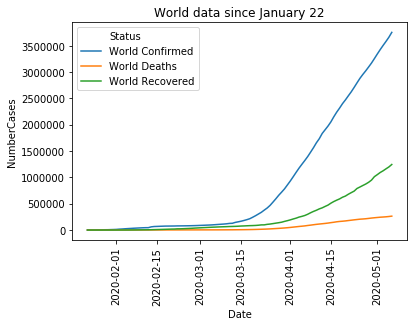

In [10]:
# Graph of daily world confirmed, death and recovered

display(world_covid_19_summary.transpose())

world_covid_19_daily_melt = pd.melt(world_covid_19_daily, id_vars=['Date'], value_vars=['World Confirmed', 'World Deaths', 'World Recovered'], var_name='Status', value_name='NumberCases')

display(world_covid_19_daily_melt['Date'][0])

#fig, axs= plt.subplots(1,2)

ax = sns.lineplot(x= 'Date', y= 'NumberCases', hue='Status', data = world_covid_19_daily_melt)
plt.xticks(rotation='vertical')
plt.title(label='World data since January 22')
plt.show()

world_covid_19_week = world_covid_19_daily_melt[world_covid_19_daily_melt['Date'] >= datetime.datetime.strptime(last_seven_days, '%m/%d/%Y')]


In [11]:
## Transposing dataframe to have countries as columns and dates as rows.
## Second dataframes of each conversion are the first 15 countries with most confirmed, death and recovered cases.

covid_19_confirmed_country_mod = covid_19_confirmed_country.copy().drop(['Lat', 'Long'], axis=1).transpose()
display(covid_19_confirmed_country_mod.iloc[[-1]])
covid_19_confirmed_top_15 = covid_19_confirmed_country_mod.iloc[[-1]].sort_values(by=yesterday,ascending=False, axis=1).iloc[:, :15]

covid_19_deaths_country_mod = covid_19_deaths_country.copy().drop(['Lat', 'Long'], axis=1).transpose()
covid_19_deaths_top_15 = covid_19_deaths_country_mod.iloc[[-1]].sort_values(by=yesterday,ascending=False, axis=1).iloc[:, :15]

covid_19_recovered_country_mod = covid_19_recovered_country.copy().drop(['Lat', 'Long'], axis=1).transpose()
covid_19_recovered_top_15 = covid_19_recovered_country_mod.iloc[[-1]].sort_values(by=yesterday,ascending=False, axis=1).iloc[:, :15]


Country,Afghanistan,Albania,Algeria,Andorra,Angola,Antigua and Barbuda,Argentina,Armenia,Australia,Austria,...,United Kingdom,Uruguay,Uzbekistan,Venezuela,Vietnam,West Bank and Gaza,Western Sahara,Yemen,Zambia,Zimbabwe
05/06/2020,3392,832,4997,751,36,25,5208,2782,6894,15684,...,202359,673,2233,379,271,374,6,25,146,34


Country,US,Spain,Italy,United Kingdom,France,Germany,Russia,Turkey,Brazil,Iran,China,Canada,Peru,India,Belgium
05/06/2020,1228603,220325,214457,202359,174224,168162,165929,131744,126611,101650,83970,64694,54817,52987,50781


Text(0.5, 1.0, 'Latest confirmed cases - top 15 countries')

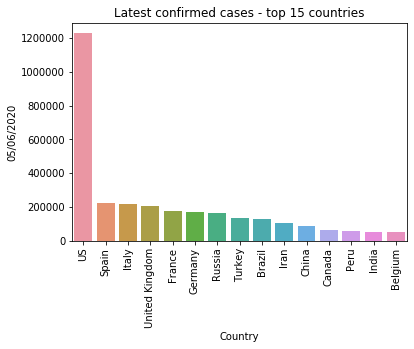

In [12]:
### Show data of the latest confirmed cases for the top 15 countries with most cases.

display(covid_19_confirmed_top_15)
transp_confirmed_top_15_latest = covid_19_confirmed_top_15.transpose()

ax_confirmed = sns.barplot(x = transp_confirmed_top_15_latest.index, y = yesterday, data=transp_confirmed_top_15_latest)
plt.xticks(rotation='vertical')
plt.title(label='Latest confirmed cases - top 15 countries')

Country,US,United Kingdom,Italy,Spain,France,Brazil,Belgium,Germany,Iran,Netherlands,China,Canada,Turkey,Sweden,Mexico
05/06/2020,73431,30150,29684,25857,25812,8588,8339,7275,6418,5221,4637,4366,3584,2941,2704


Text(0.5, 1.0, 'Latest death cases - top 15 countries')

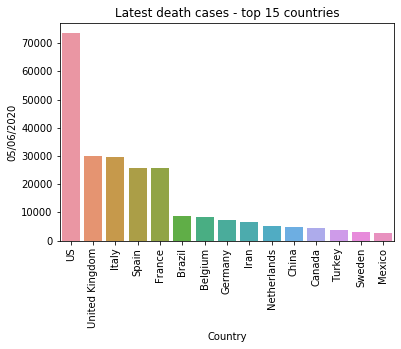

In [13]:
### Show data of the latest confirmed cases for the top 15 countries with most cases.

display(covid_19_deaths_top_15)
transp_deaths_top_15_latest = covid_19_deaths_top_15.transpose()

ax_deaths = sns.barplot(x = transp_deaths_top_15_latest.index, y = yesterday, data=transp_deaths_top_15_latest)
plt.xticks(rotation='vertical')
plt.title(label='Latest death cases - top 15 countries')

Country,US,Germany,Spain,Italy,Iran,China,Turkey,France,Brazil,Canada,Switzerland,Russia,Mexico,Peru,Ireland
05/06/2020,189910,139900,126002,93245,81587,78929,78202,54079,51370,28184,25700,21327,17781,17527,17110


Text(0.5, 1.0, 'Latest recovered cases - top 15 countries')

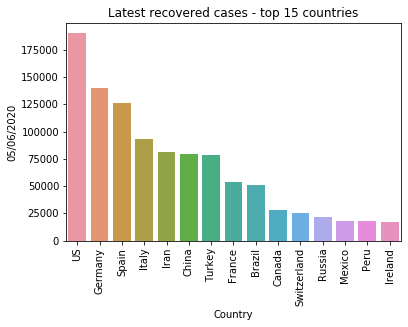

In [14]:
### Show data of the latest confirmed cases for the top 15 countries with most cases.

display(covid_19_recovered_top_15)
transp_recovered_top_15_latest = covid_19_recovered_top_15.transpose()

ax_recovered = sns.barplot(x = transp_recovered_top_15_latest.index, y = yesterday, data=transp_recovered_top_15_latest)
plt.xticks(rotation='vertical')
plt.title(label='Latest recovered cases - top 15 countries')

Country,Brazil,Peru,Ecuador,Mexico,Chile,Colombia,Panama,Argentina,Bolivia,Honduras,Guatemala,Costa Rica,Uruguay,Paraguay,Venezuela,Nicaragua
05/06/2020,126611,54817,31881,27634,23048,8959,7731,5208,1886,1461,798,761,673,440,379,16


Text(0.5, 1.0, 'Confirmed cases in Latin American Cities')

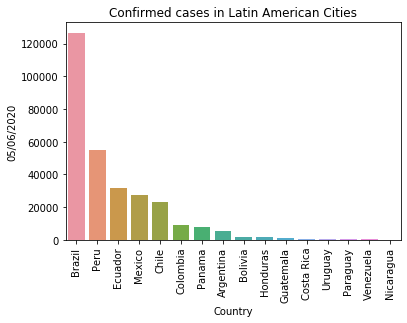

In [15]:
latin_countries = ['Mexico', 'Peru', 'Bolivia', 'Ecuador', 'Colombia', 'Brazil','Argentina', 'Venezuela', 'Chile', 'Panama','Costa Rica', 'Uruguay', 'Paraguay', 'Honduras', 'Nicaragua', 'Guatemala']
confirmed_covid_19_latest_LA = covid_19_confirmed_country_mod.iloc[[-1]].loc[:,latin_countries].sort_values(by=yesterday,ascending=False, axis=1)
display(confirmed_covid_19_latest_LA)
confirmed_transp_LA = confirmed_covid_19_latest_LA.transpose()

ax_recovered = sns.barplot(x = confirmed_transp_LA.index, y=yesterday, data=confirmed_transp_LA)
plt.xticks(rotation='vertical')
plt.title(label='Confirmed cases in Latin American Cities')

Country,Brazil,Mexico,Ecuador,Peru,Colombia,Chile,Argentina,Panama,Honduras,Bolivia,Guatemala,Uruguay,Venezuela,Paraguay,Costa Rica,Nicaragua
05/06/2020,8588,2704,1618,1533,397,281,273,218,99,91,21,17,10,10,6,5


Text(0.5, 1.0, 'Deaths in Latin American Cities')

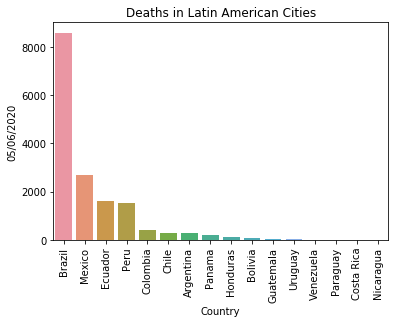

In [16]:
deaths_covid_19_latest_LA = covid_19_deaths_country_mod.iloc[[-1]].loc[:,latin_countries].sort_values(by=yesterday,ascending=False, axis=1)
deaths_transp_LA = deaths_covid_19_latest_LA.transpose()
display(deaths_covid_19_latest_LA)

ax_recovered = sns.barplot(x = deaths_transp_LA.index, y=yesterday, data=deaths_transp_LA)
plt.xticks(rotation='vertical')
plt.title(label='Deaths in Latin American Cities')

Country,Brazil,Mexico,Peru,Chile,Ecuador,Colombia,Argentina,Panama,Uruguay,Costa Rica,Bolivia,Venezuela,Paraguay,Honduras,Guatemala,Nicaragua
05/06/2020,51370,17781,17527,11189,3433,2148,1524,859,486,428,198,176,142,132,86,7


Text(0.5, 1.0, 'Recovered in Latin American Cities')

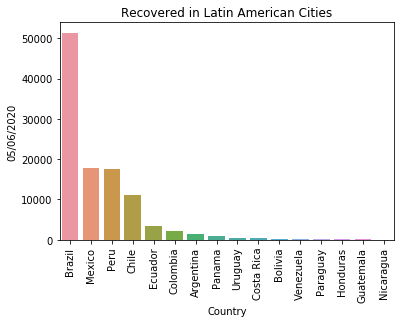

In [17]:
recovered_covid_19_latest_LA = covid_19_recovered_country_mod.iloc[[-1]].loc[:,latin_countries].sort_values(by=yesterday,ascending=False, axis=1)
recovered_transp_LA = recovered_covid_19_latest_LA.transpose()
display(recovered_covid_19_latest_LA)

ax_recovered = sns.barplot(x = recovered_transp_LA.index, y=yesterday, data=recovered_transp_LA)
plt.xticks(rotation='vertical')
plt.title(label='Recovered in Latin American Cities')

In [18]:
### We will do a country by country analysis for the yop 10 world countries in confirmed cases (we will include 
### information of the deaths and recovery in each graph) and the 5 latin american countries with most cases

top_10 = ['US', 'Spain', 'Italy', 'United Kingdom', 'France', 'Germany', 'Korea, South', 'Russia', 'China', 'Iran']#, 'Canada']

latin_america = ['Peru', 'Mexico', 'Chile', 'Ecuador', 'Colombia', 'Argentina', 'Panama', 'Uruguay',
                'Venezuela', 'Bolivia', 'Paraguay', 'Brazil']

countries_list = top_10 + latin_america

In [19]:
# Copy confirmed data frame and slice the information you want
covid_19_confirmed_last_week = covid_19_confirmed_country.copy().drop(['Lat', 'Long'], axis=1)
covid_19_confirmed_last_week_top_10 = covid_19_confirmed_last_week.loc[top_10,:]
covid_19_confirmed_last_week_latin_america = covid_19_confirmed_last_week.loc[latin_america,'03/10/2020':]

countries_ = covid_19_confirmed_last_week_top_10.index
dates = covid_19_confirmed_last_week_top_10.columns
# Melt dataframe to create line plots
covid_19_confirmed_last_week_top_10_melt = pd.melt(covid_19_confirmed_last_week_top_10.reset_index(),
                                           id_vars='Country', value_vars=dates.tolist(), 
                                           var_name='Date', value_name='Confirmed')


countries_ = covid_19_confirmed_last_week_latin_america.index
dates = covid_19_confirmed_last_week_latin_america.columns
# Melt dataframe to create line plots
covid_19_confirmed_last_week_latin_america_melt = pd.melt(covid_19_confirmed_last_week_latin_america.reset_index(),
                                           id_vars='Country', value_vars=dates.tolist(), 
                                           var_name='Date', value_name='Confirmed')

top_10_plt = px.line(covid_19_confirmed_last_week_top_10_melt, x='Date', 
                     y='Confirmed', line_group='Country', color='Country',
                    title='Confirmed cases over time in some of the most affected countries overall')


latin_america_plt = px.line(covid_19_confirmed_last_week_latin_america_melt, x='Date', 
                     y='Confirmed', line_group='Country', color='Country',
                    title='Confirmed cases over time in some latin american countries since 03/10/2020')


display(top_10_plt)
display(latin_america_plt)



In [20]:
# Copy deaths data frame and slice information you want
covid_19_deaths_last_week = covid_19_deaths_country.copy().drop(['Lat', 'Long'], axis=1)
covid_19_deaths_top_10 = covid_19_deaths_last_week.loc[top_10,:]
covid_19_deaths_latin_america = covid_19_deaths_last_week.loc[latin_america,'03/10/2020':]

countries = covid_19_deaths_top_10.index
dates = covid_19_deaths_top_10.columns
# Melt dataframe to creat line plots
covid_19_deaths_top_10_melt = pd.melt(covid_19_deaths_top_10.reset_index(), id_vars='Country',
                                        value_vars=dates.tolist(), var_name='Date', value_name='Deaths')

countries_ = covid_19_deaths_latin_america.index
dates = covid_19_deaths_latin_america.columns
# Melt dataframe to create line plots
covid_19_deaths_latin_america_melt = pd.melt(covid_19_deaths_latin_america.reset_index(),
                                           id_vars='Country', value_vars=dates.tolist(), 
                                           var_name='Date', value_name='Deaths')

top_10_deaths_plt = px.line(covid_19_deaths_top_10_melt, x='Date', 
                     y='Deaths', line_group='Country', color='Country',
                    title='Death cases over time in some of the most affected countries overall')


latin_america_deaths_plt = px.line(covid_19_deaths_latin_america_melt, x='Date', 
                     y='Deaths', line_group='Country', color='Country',
                    title='Death cases over time in some latin american countries since 03/10/2020')


display(top_10_deaths_plt)
display(latin_america_deaths_plt)


In [21]:
# Copy recovered data frame and slice information you want
covid_19_recovered_last_week = covid_19_recovered_country.copy().drop(['Lat', 'Long'], axis=1)
covid_19_recovered_top_10 = covid_19_recovered_last_week.loc[top_10,:]
covid_19_recovered_latin_america = covid_19_recovered_last_week.loc[latin_america,'03/10/2020':]

countries = covid_19_recovered_top_10.index
dates = covid_19_recovered_top_10.columns
# Melt dataframe to create line plots
covid_19_recovered_top_10_melt = pd.melt(covid_19_recovered_top_10.reset_index(), id_vars='Country',
                                        value_vars=dates.tolist(), var_name='Date', value_name='Recovered')

countries_ = covid_19_recovered_latin_america.index
dates = covid_19_recovered_latin_america.columns
# Melt dataframe to create line plots
covid_19_recovered_latin_america_melt = pd.melt(covid_19_recovered_latin_america.reset_index(),
                                           id_vars='Country', value_vars=dates.tolist(), 
                                           var_name='Date', value_name='Recovered')

top_10_recovered_plt = px.line(covid_19_recovered_top_10_melt, x='Date', 
                     y='Recovered', line_group='Country', color='Country',
                    title='Recovered cases over time in some of the most affected countries overall')


latin_america_recovered_plt = px.line(covid_19_recovered_latin_america_melt, x='Date', 
                     y='Recovered', line_group='Country', color='Country',
                    title='Recovered cases over time in some latin american countries since 03/10/2020')


display(top_10_recovered_plt)
display(latin_america_recovered_plt)



In [22]:
# Copy infectiones per day dataframe and slice information you want for a week and total
covid_19_infections_per_day_last_week = covid_19_infections_per_day_orig_country.copy().drop(['Lat', 'Long'], axis=1)
covid_19_infections_per_day_complete_sliced = covid_19_infections_per_day_last_week.loc[top_10, :]
covid_19_infections_per_day_latin_america = covid_19_infections_per_day_last_week.loc[latin_america, '03/10/2020':]

countries = covid_19_infections_per_day_complete_sliced.index
dates = covid_19_infections_per_day_complete_sliced.columns
# Melt dataframe to create line plots
covid_19_infections_per_day_complete_melt = pd.melt(covid_19_infections_per_day_complete_sliced.reset_index(), 
                                                     id_vars='Country', value_vars=dates.tolist(), 
                                                     var_name='Date', value_name='New Infections')


countries = covid_19_infections_per_day_latin_america.index
dates = covid_19_infections_per_day_latin_america.columns
covid_19_infections_per_day_latin_america_melt = pd.melt(covid_19_infections_per_day_latin_america.reset_index(), 
                                                     id_vars='Country', value_vars=dates.tolist(), 
                                                     var_name='Date', value_name='New Infections')


infections_per_day_complete_plt = px.line(covid_19_infections_per_day_complete_melt, x='Date', 
                     y='New Infections', line_group='Country', color='Country',
                    title='Per day new infections over time in some of the most affected countries overall')


infections_per_day_latin_america_plt = px.line(covid_19_infections_per_day_latin_america_melt, x='Date', 
                     y='New Infections', line_group='Country', color='Country',
                    title='Per day new infections over time in some latin american countries since 03/10/2020')


display(infections_per_day_complete_plt)
display(infections_per_day_latin_america_plt)



In [23]:
# Copy infectiones per day dataframe and slice information you want for a week and total
covid_19_infections_mv_avg = covid_19_infections_mv_avg_country.copy().drop(['Lat', 'Long'], axis=1)
covid_19_infections_mv_avg_top_10 = covid_19_infections_mv_avg.loc[top_10, :]
covid_19_infections_mv_avg_latin_america = covid_19_infections_mv_avg.loc[latin_america, '03/10/2020':]

countries = covid_19_infections_mv_avg_top_10.index
dates = covid_19_infections_mv_avg_top_10.columns
# Melt dataframe to create line plots
covid_19_infections_mv_avg_top_10_melt = pd.melt(covid_19_infections_mv_avg_top_10.reset_index(), 
                                                     id_vars='Country', value_vars=dates.tolist(), 
                                                     var_name='Date', value_name='5 day avg infections')


countries = covid_19_infections_mv_avg_latin_america.index
dates = covid_19_infections_mv_avg_latin_america.columns
covid_19_infections_mv_avg_latin_america_melt = pd.melt(covid_19_infections_mv_avg_latin_america.reset_index(), 
                                                     id_vars='Country', value_vars=dates.tolist(), 
                                                     var_name='Date', value_name='5 day avg infections')


infections_mv_avg_top_10_plt = px.line(covid_19_infections_mv_avg_top_10_melt, x='Date', 
                     y='5 day avg infections', line_group='Country', color='Country',
                    title='Per day new infections over time in some of the most affected countries overall')


infections_mv_avg_latin_america_plt = px.line(covid_19_infections_mv_avg_latin_america_melt, x='Date', 
                     y='5 day avg infections', line_group='Country', color='Country',
                    title='Per day new infections over time in some latin american countries since 03/10/2020')


display(infections_mv_avg_top_10_plt)
display(infections_mv_avg_latin_america_plt)

In [24]:
# Melt confirmed last seven days data to do line plots


#px.line(covid_19_infections_per_day_complete_melt, x='Date', y='Confirmed', line_group='Country', color='Country')

In [25]:
## Plotting world data as a heatmap

# Filtering the world data to only contain information of the country, the latitude, longitude and latest data (up to yesterday)
covid_19_confirmed_worldmap = covid_19_confirmed_orig.copy()
covid_19_deaths_worldmap = covid_19_deaths_orig.copy()
covid_19_recovered_worldmap = covid_19_recovered_orig.copy()



In [26]:
m = folium.Map(location=[10,0], tiles="cartodbpositron", zoom_start=2, max_zoom=10, min_zoom=2)
world = os.path.join('helper_data', 'world_map2_corrected.json')

In [27]:
# World visualizations are in logarithmic scale.

fig = px.choropleth(covid_19_confirmed_worldmap.filter(['Country', 'Lat', 'Long', yesterday], axis=1), 
                    geojson=world,
                    locations='Country', 
                    featureidkey='properties.name_sort',
                    color_continuous_scale=px.colors.sequential.YlOrBr,
                    color=np.log10(covid_19_confirmed_worldmap[yesterday] + 1))

fig.update_layout(margin={"r":0, "t":0, "l":0, "b":0})
fig.show()

In [28]:
fig_deaths = px.choropleth(covid_19_deaths_worldmap.filter(['Country', 'Lat', 'Long', yesterday], axis=1), 
                    geojson=world,
                    locations='Country', 
                    featureidkey='properties.name_sort',
                    color_continuous_scale=px.colors.sequential.YlOrRd,
                    color=np.log10(covid_19_deaths_worldmap[yesterday] + 1))

fig_deaths.update_layout(margin={"r":0, "t":0, "l":0, "b":0})
fig_deaths.show()

In [29]:
fig_recovered = px.choropleth(covid_19_recovered_worldmap.filter(['Country', 'Lat', 'Long', yesterday], axis=1), 
                    geojson=world,
                    locations='Country', 
                    featureidkey='properties.name_sort',
                    color_continuous_scale=px.colors.sequential.YlGnBu,
                    color=np.log10(covid_19_recovered_worldmap[yesterday] + 1))
                    #animation_frame=covid_19_recovered_worldmap.columns[4:],
                    #animation_group='Country')

fig_recovered.update_layout(margin={"r":0, "t":0, "l":0, "b":0})
fig_recovered.show()

In [30]:
import plotly_express as px

### Melt world datasets for animated visualization of confirmed cases (Spread) and death cases around the world.

covid_19_confirmed_worldmap_slide = covid_19_confirmed_worldmap.copy().groupby('Country').sum().drop(['Lat','Long'], axis=1).reset_index()
covid_19_confirmed_worldmap_slide = covid_19_confirmed_worldmap_slide.melt(id_vars=['Country'], value_vars=covid_19_confirmed_worldmap_slide.columns[1:], var_name = 'Date', value_name='Value')
display(covid_19_confirmed_worldmap_slide)

covid_19_deaths_worldmap_slide = covid_19_deaths_worldmap.copy().groupby('Country').sum().drop(['Lat','Long'], axis=1).reset_index()
covid_19_deaths_worldmap_slide = covid_19_deaths_worldmap_slide.melt(id_vars=['Country'], value_vars=covid_19_deaths_worldmap_slide.columns[1:], var_name = 'Date', value_name='Value')


# Filtering and melting data of new infections per day
covid_19_infections_per_day = covid_19_infections_per_day_orig_country.copy().drop(['Lat', 'Long'], axis=1)
countries = covid_19_infections_per_day.index
dates = covid_19_infections_per_day.columns

covid_19_infections_per_day_worldmap = pd.melt(covid_19_infections_per_day.reset_index(), 
                                                     id_vars='Country', value_vars=dates.tolist(), 
                                                     var_name='Date', value_name='New Infections')
display(covid_19_infections_per_day_worldmap)


,Country,Date,Value
0,Afghanistan,01/22/2020,0
1,Albania,01/22/2020,0
2,Algeria,01/22/2020,0
3,Andorra,01/22/2020,0
4,Angola,01/22/2020,0
...,...,...,...
19817,West Bank and Gaza,05/06/2020,374
19818,Western Sahara,05/06/2020,6
19819,Yemen,05/06/2020,25
19820,Zambia,05/06/2020,146


,Country,Date,New Infections
0,Afghanistan,01/22/2020,0
1,Albania,01/22/2020,0
2,Algeria,01/22/2020,0
3,Andorra,01/22/2020,0
4,Angola,01/22/2020,0
...,...,...,...
19817,West Bank and Gaza,05/06/2020,3
19818,Western Sahara,05/06/2020,0
19819,Yemen,05/06/2020,3
19820,Zambia,05/06/2020,8


In [31]:
fig_confirmed_slide = px.choropleth(covid_19_confirmed_worldmap_slide,
                    geojson=world,
                    locations='Country', 
                    featureidkey='properties.name_sort',
                    color_continuous_scale=px.colors.sequential.YlOrBr,
                    color=np.log10(covid_19_confirmed_worldmap_slide['Value'] + 1),
                    animation_frame='Date',
                    animation_group='Country',
                    title='Evolution of the number of worldwide confirmed cases in log scale')

fig_confirmed_slide.update_layout(margin={"r":0, "t":0, "l":0, "b":0})
fig_confirmed_slide.show()

In [32]:
fig_deaths_slide = px.choropleth(covid_19_deaths_worldmap_slide,
                    geojson=world,
                    locations='Country', 
                    featureidkey='properties.name_sort',
                    color_continuous_scale=px.colors.sequential.YlOrRd,
                    color=np.log10(covid_19_deaths_worldmap_slide['Value'] + 1),
                    animation_frame='Date',
                    animation_group='Country',
                    title='Evolution of worldwide deaths in log scale')

fig_deaths_slide.update_layout(margin={"r":0, "t":0, "l":0, "b":0})
fig_deaths_slide.show()

In [33]:
fig_infections_per_day_slide = px.choropleth(covid_19_infections_per_day_worldmap,
                    geojson=world,
                    locations='Country', 
                    featureidkey='properties.name_sort',
                    color_continuous_scale=px.colors.sequential.YlOrRd,
                    color=np.log10(covid_19_infections_per_day_worldmap['New Infections'] + 1),
                    animation_frame='Date',
                    animation_group='Country',
                    title='Evolution of infections per day in log scale')

fig_infections_per_day_slide.update_layout(margin={"r":0, "t":0, "l":0, "b":0})
fig_infections_per_day_slide.show()


#display(covid_19_infections_per_day_complete_melt)
#display(covid_19_infections_per_day_latin_america_melt)

/home/julsoles/anaconda3/lib/python3.7/site-packages/pandas/core/series.py:679: RuntimeWarning:

divide by zero encountered in log10

/home/julsoles/anaconda3/lib/python3.7/site-packages/pandas/core/series.py:679: RuntimeWarning:

invalid value encountered in log10



In [34]:
#### NN Model for prediction

from keras.layers import Dense, Input, Activation, ReLU, LeakyReLU
from keras import models
from keras.models import Sequential
from keras.optimizers import Adam, SGD


Visible=  Input(shape=(1,))

Dense_l1 = Dense(70, name='Dense_l1')(Visible)
ReLU_l1 = LeakyReLU(name='LeakyReLU_l1')(Dense_l1)

Dense_l2 = Dense(70, name='Dense_l2')(ReLU_l1)
ReLU_l2 = LeakyReLU(name='LeakyReLU_l2')(Dense_l2)

Dense_l3 = Dense(70, name='Dense_l3')(ReLU_l2)
ReLU_l3 = LeakyReLU(name='LeakyReLU_l3')(Dense_l3)

Dense_l4 = Dense(70, name='Dense_l4')(ReLU_l3)
ReLU_l4 = LeakyReLU(name='LeakyReLU_l4')(Dense_l4)

Dense_l5 = Dense(70, name='Dense_l5')(ReLU_l4)
ReLU_l5 = LeakyReLU(name='LeakyReLU_l5')(Dense_l5)

Dense_l6 = Dense(70, name='Dense_l6')(ReLU_l5)
ReLU_l6 = LeakyReLU(name='LeakyReLU_l6')(Dense_l6)

Dense_l7 = Dense(70, name='Dense_l7')(ReLU_l6)
ReLU_l7 = LeakyReLU(name='LeakyReLU_l7')(Dense_l7)

Dense_l8 = Dense(70, name='Dense_l8')(ReLU_l7)
ReLU_l8 = LeakyReLU(name='LeakyReLU_l8')(Dense_l8)

Dense_l9 = Dense(70, name='Dense_l9')(ReLU_l8)
ReLU_l9 = LeakyReLU(name='LeakyReLU_l9')(Dense_l9)

Dense_l10 = Dense(70, name='Dense_l10')(ReLU_l9)
ReLU_l10 = LeakyReLU(name='LeakyReLU_l10')(Dense_l10)

#Dense_l11 = Dense(50, name='Dense_l11')(ReLU_l10)
#ReLU_l11 = LeakyReLU(name='LeakyReLU_l11')(Dense_l11)

#Dense_l12 = Dense(50, name='Dense_l12')(ReLU_l11)
#ReLU_l12 = LeakyReLU(name='LeakyReLU_l12')(Dense_l12)

#Dense_l13 = Dense(50, name='Dense_l13')(ReLU_l12)
#ReLU_l13 = LeakyReLU(name='LeakyReLU_l13')(Dense_l13)

#Dense_l14 = Dense(50, name='Dense_l14')(ReLU_l13)
#ReLU_l14 = LeakyReLU(name='LeakyReLU_l14')(Dense_l14)

Output = Dense(1, name='Output')(ReLU_l10)
ReLU_Output = ReLU(name='ReLU_Output')(Output)

model = models.Model(inputs=Visible, outputs=ReLU_Output)

model.compile(loss='mean_squared_error', optimizer=Adam(lr=0.001), metrics=['accuracy'])


In [35]:
# Saving model for world confirmed predictions

#world_confirmed_target_data = covid_19_confirmed.copy().loc[:,'World Confirmed'].to_numpy().astype('float32')

#y_confirmed = np.log10(world_confirmed_target_data)
#x_confirmed = np.arange(1, len(y_confirmed) + 1)

#epochs = 5000

#model.fit(x_confirmed.reshape(y_confirmed.shape[0],1), y_confirmed.reshape(y_confirmed.shape[0],1), epochs=epochs, batch_size=10)

#model.save('worldwide_confirmed_model.h5')


In [36]:
world_confirmed_nn_model = models.load_model('worldwide_confirmed_model.h5')

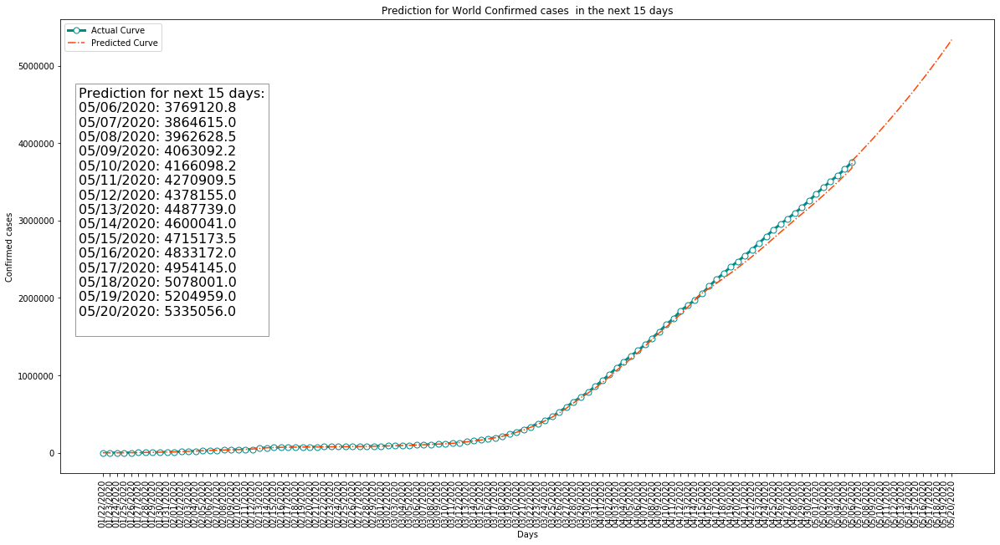

In [37]:
def prediction_plot(data_frame, model, type_string='World Confirmed', prediction_days=15, country=None):
    """
    Function that gets the predictions from the model and generates the plot of the actual vs predicted data
    for whatever type of data (type_string) which could be confirmed cases, death cases, recovered cases or 
    new infection cases per day.
    """
    pred_days = prediction_days
    
    y_data = data_frame.copy()
    
    temp_data = y_data.loc[:,type_string]
    pred_data = np.power(10, model.predict(np.arange(1, len(temp_data) + pred_days + 1)))
    
    f = plt.figure(figsize=(20,10))
    ax = f.add_subplot(111)
    
    date = y_data['Date'].apply(lambda x: x.strftime('%m/%d/%Y')).to_list()
    
    marker_style = dict(linewidth=3, linestyle='-', marker='o', markersize=7, markerfacecolor='#ffffff')
    
    tmp = 100000
    
    plt.plot(date, temp_data, '-.', color='darkcyan', **marker_style, label='Actual Curve')
    
    nextdays = pd.date_range(datetime.datetime.today(), periods=pred_days).strftime('%m/%d/%Y').to_list()
    
    date_pred = date + nextdays
    
    country_string = 'in ' + country if country is not None else ""
    
    plt.plot(date_pred, pred_data, '-.', color='orangered', label='Predicted Curve')

    plt.legend()
    plt.title("Prediction for " + type_string + ' cases ' + country_string +' in the next 15 days')
    plt.xlabel(xlabel='Days')
    plt.ylabel(ylabel='Confirmed cases')
    plt.xticks(rotation='vertical')

    text = "Prediction for next " + str(prediction_days) + " days:\n"
    for i in range(prediction_days):
        #text += nextdays[i] +': ' + str(np.round(pred_data[-1 * (prediction_days - i)], -3)[0]) + ' \n' #/ 100000) + ' \n'
        text += nextdays[i] +': ' + str(pred_data[-1 * (prediction_days - i)][0]) + ' \n'
    
    plt.text(0.02, 0.85, text, fontsize=16, horizontalalignment='left', verticalalignment='top', transform=ax.transAxes, bbox=dict(facecolor='white', alpha=0.4))
    
    return plt

plt_confirmed = prediction_plot(covid_19_confirmed,world_confirmed_nn_model, type_string='World Confirmed',
                                prediction_days=15)

plt_confirmed.show()

In [38]:
# Saving model for world death predictions

#world_confirmed_target_data = covid_19_deaths.copy().loc[:,'World Deaths'].to_numpy().astype('float32')

#y_confirmed = np.log10(world_confirmed_target_data)
#display(y_confirmed)
#x_confirmed = np.arange(1, len(y_confirmed) + 1)

#epochs = 5000

#model.fit(x_confirmed.reshape(y_confirmed.shape[0],1), y_confirmed.reshape(y_confirmed.shape[0],1), epochs=epochs, batch_size=10)

#model.save('worldwide_deaths_model.h5')

In [39]:
world_deaths_nn_model = models.load_model('worldwide_deaths_model.h5')

,Date,World Deaths
0,2020-01-22,17
1,2020-01-23,18
2,2020-01-24,26
3,2020-01-25,42
4,2020-01-26,56
...,...,...
101,2020-05-02,243808
102,2020-05-03,247470
103,2020-05-04,251537
104,2020-05-05,257239


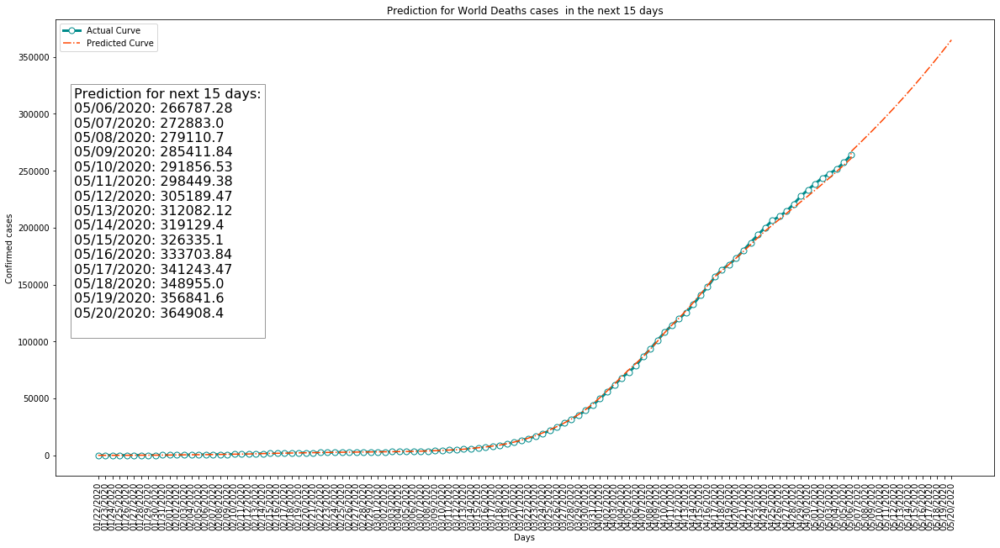

In [40]:
display(covid_19_deaths)
plt_deaths = prediction_plot(covid_19_deaths,world_deaths_nn_model, type_string='World Deaths',
                                prediction_days=15)

plt_deaths.show()

In [41]:
def daily_infections_data_extracter(orig_infections_per_day, country):
    infections_per_day = orig_infections_per_day.copy().reset_index()
    infections_country = infections_per_day[infections_per_day['Country'] == country].transpose()
    infections_country = infections_country.iloc[1:,0].to_numpy().astype('float32')
    return infections_country

usa_infection_data = daily_infections_data_extracter(covid_19_infections_per_day_last_week, 'US')
mexico_infection_data = daily_infections_data_extracter(covid_19_infections_per_day_last_week, 'Mexico')
peru_infection_data = daily_infections_data_extracter(covid_19_infections_per_day_last_week, 'Peru')
bolivia_infection_data = daily_infections_data_extracter(covid_19_infections_per_day_last_week, 'Bolivia')
italy_infection_data = daily_infections_data_extracter(covid_19_infections_per_day_last_week, 'Italy')
uk_infection_data = daily_infections_data_extracter(covid_19_infections_per_day_last_week, 'United Kingdom')
germany_infection_data = daily_infections_data_extracter(covid_19_infections_per_day_last_week, 'Germany')



In [42]:
# Saving model for world confirmed predictions

#usa_infection_target_data = usa_infection_data + 1.

#display(usa_infection_target_data)

#y_confirmed = np.log10(usa_infection_target_data)

#display(y_confirmed)
#x_confirmed = np.arange(1, len(y_confirmed) + 1)

#epochs = 5000

#model.fit(x_confirmed.reshape(y_confirmed.shape[0],1), y_confirmed.reshape(y_confirmed.shape[0],1), epochs=epochs, batch_size=10)

#model.save('usa_infection_model.h5')

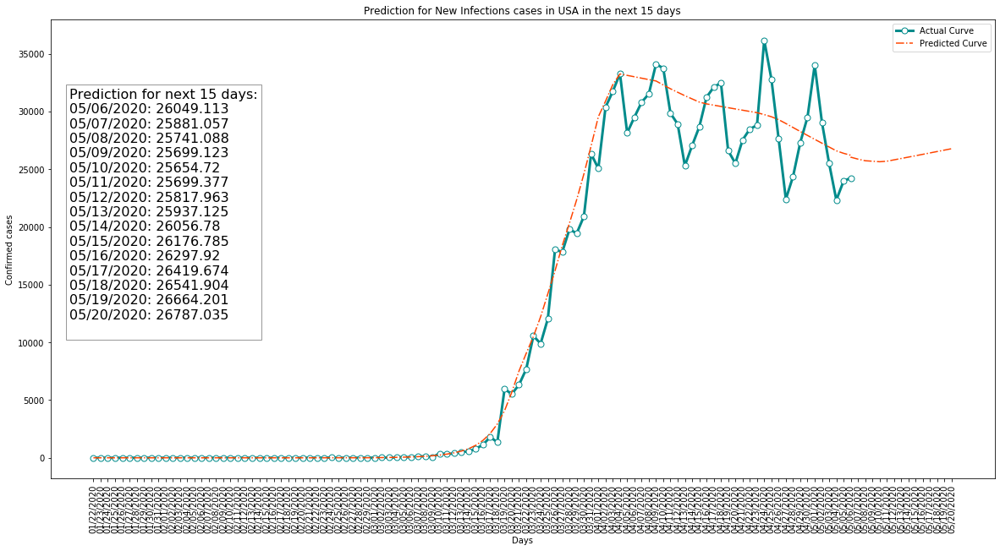

In [43]:
usa_infection_nn_model = models.load_model('usa_infection_model.h5')

covid_19_infections_per_day = covid_19_infections_per_day_last_week.copy().reset_index()

usa_actual_infections = covid_19_infections_per_day[covid_19_infections_per_day['Country'] == 'US'].transpose()
usa_actual_infections = usa_actual_infections.reset_index().loc[1:,:]
usa_actual_infections.columns = ['Date', 'New Infections']
usa_actual_infections['Date'] = pd.to_datetime(usa_actual_infections['Date'])

plt_usa_infections = prediction_plot(usa_actual_infections, usa_infection_nn_model, type_string='New Infections',
                                   prediction_days=15, country='USA')

plt_usa_infections.show()

In [44]:
# Saving model for world confirmed predictions

#mexico_infection_target_data = mexico_infection_data + 1.

#display(mexico_infection_target_data)

#y_confirmed = np.log10(mexico_infection_target_data)

#display(y_confirmed)
#x_confirmed = np.arange(1, len(y_confirmed) + 1)

#epochs = 5000

#model.fit(x_confirmed.reshape(y_confirmed.shape[0],1), y_confirmed.reshape(y_confirmed.shape[0],1), epochs=epochs, batch_size=10)

#model.save('mexico_infection_model.h5')

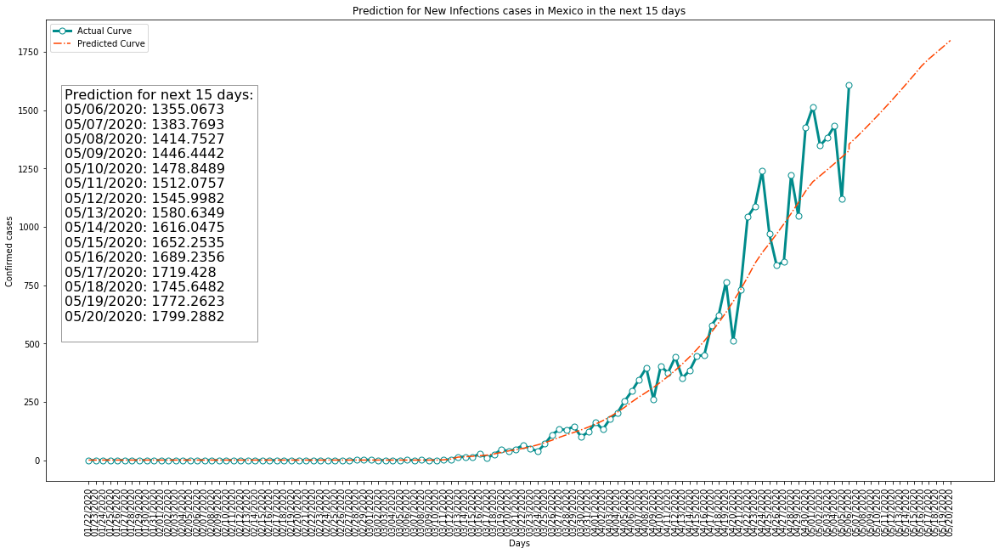

In [45]:
mexico_infection_nn_model = models.load_model('mexico_infection_model.h5')

covid_19_infections_per_day = covid_19_infections_per_day_last_week.copy().reset_index()

mexico_actual_infections = covid_19_infections_per_day[covid_19_infections_per_day['Country'] == 'Mexico'].transpose()
mexico_actual_infections = mexico_actual_infections.reset_index().loc[1:,:]
mexico_actual_infections.columns = ['Date', 'New Infections']
mexico_actual_infections['Date'] = pd.to_datetime(mexico_actual_infections['Date'])

plt_mexico_infections = prediction_plot(mexico_actual_infections, mexico_infection_nn_model, type_string='New Infections',
                                   prediction_days=15, country='Mexico')

plt_mexico_infections.show()

In [46]:
# Saving model for world confirmed predictions

#peru_infection_target_data = peru_infection_data + 1.

#display(peru_infection_target_data)

#y_confirmed = np.log10(peru_infection_target_data)

#display(y_confirmed)
#x_confirmed = np.arange(1, len(y_confirmed) + 1)

#epochs = 5000

#model.fit(x_confirmed.reshape(y_confirmed.shape[0],1), y_confirmed.reshape(y_confirmed.shape[0],1), epochs=epochs, batch_size=10)

#model.save('peru_infection_model.h5')

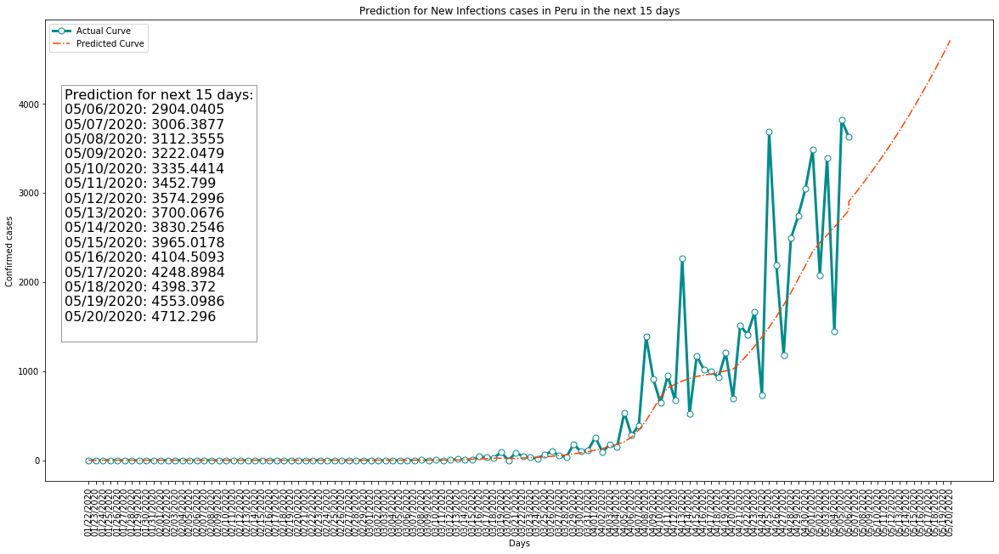

In [47]:
peru_infection_nn_model = models.load_model('peru_infection_model.h5')

covid_19_infections_per_day = covid_19_infections_per_day_last_week.copy().reset_index()

peru_actual_infections = covid_19_infections_per_day[covid_19_infections_per_day['Country'] == 'Peru'].transpose()
peru_actual_infections = peru_actual_infections.reset_index().loc[1:,:]
peru_actual_infections.columns = ['Date', 'New Infections']
peru_actual_infections['Date'] = pd.to_datetime(peru_actual_infections['Date'])

plt_peru_infections = prediction_plot(peru_actual_infections, peru_infection_nn_model, type_string='New Infections',
                                   prediction_days=15, country='Peru')

plt_peru_infections.show()

In [48]:
# Saving model for world confirmed predictions

#bolivia_infection_target_data = bolivia_infection_data + 1.

#display(bolivia_infection_target_data)

#y_confirmed = np.log10(bolivia_infection_target_data)

#display(y_confirmed)
#x_confirmed = np.arange(1, len(y_confirmed) + 1)

#epochs = 5000

#model.fit(x_confirmed.reshape(y_confirmed.shape[0],1), y_confirmed.reshape(y_confirmed.shape[0],1), epochs=epochs, batch_size=10)

#model.save('bolivia_infection_model.h5')

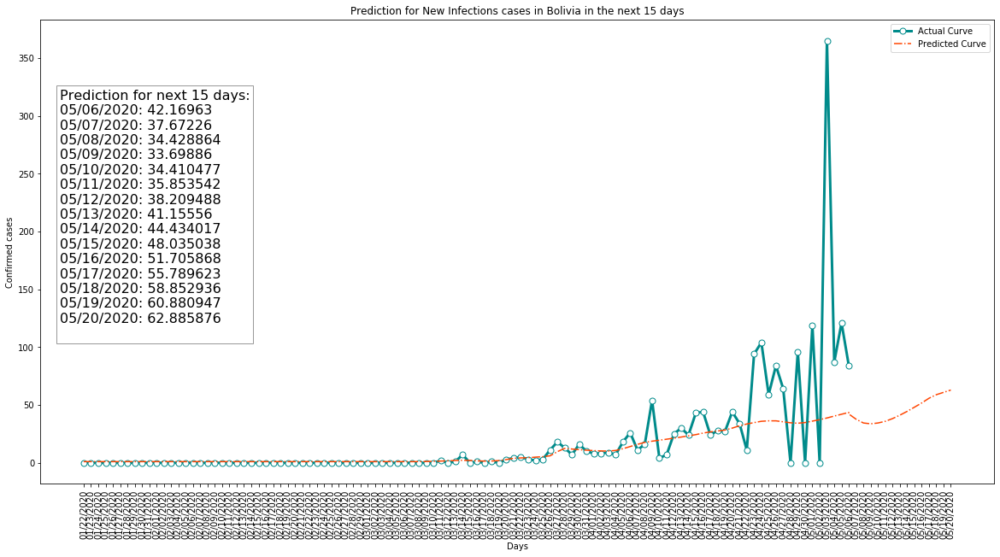

In [49]:
bolivia_infection_nn_model = models.load_model('bolivia_infection_model.h5')

covid_19_infections_per_day = covid_19_infections_per_day_last_week.copy().reset_index()

bolivia_actual_infections = covid_19_infections_per_day[covid_19_infections_per_day['Country'] == 'Bolivia'].transpose()
bolivia_actual_infections = bolivia_actual_infections.reset_index().loc[1:,:]
bolivia_actual_infections.columns = ['Date', 'New Infections']
bolivia_actual_infections['Date'] = pd.to_datetime(bolivia_actual_infections['Date'])

plt_bolivia_infections = prediction_plot(bolivia_actual_infections, bolivia_infection_nn_model, type_string='New Infections',
                                   prediction_days=15, country='Bolivia')

plt_bolivia_infections.show()

In [50]:
# Saving model for world confirmed predictions

#italy_infection_target_data = italy_infection_data + 1.

#display(italy_infection_target_data)

#y_confirmed = np.log10(italy_infection_target_data)

#display(y_confirmed)
#x_confirmed = np.arange(1, len(y_confirmed) + 1)

#epochs = 5000

#model.fit(x_confirmed.reshape(y_confirmed.shape[0],1), y_confirmed.reshape(y_confirmed.shape[0],1), epochs=epochs, batch_size=10)

#model.save('italy_infection_model.h5')

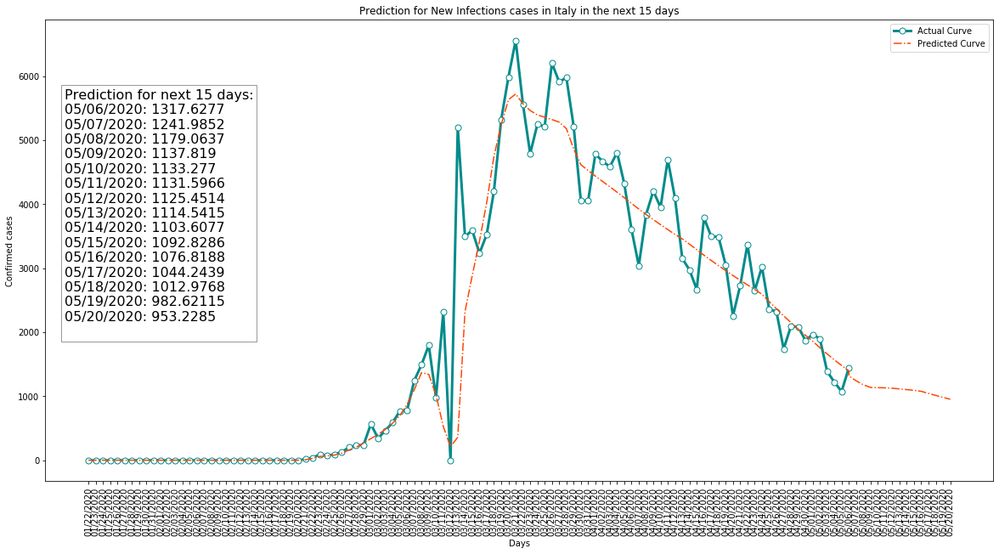

In [51]:
italy_infection_nn_model = models.load_model('italy_infection_model.h5')

covid_19_infections_per_day = covid_19_infections_per_day_last_week.copy().reset_index()

italy_actual_infections = covid_19_infections_per_day[covid_19_infections_per_day['Country'] == 'Italy'].transpose()
italy_actual_infections = italy_actual_infections.reset_index().loc[1:,:]
italy_actual_infections.columns = ['Date', 'New Infections']
italy_actual_infections['Date'] = pd.to_datetime(italy_actual_infections['Date'])

plt_italy_infections = prediction_plot(italy_actual_infections, italy_infection_nn_model, type_string='New Infections',
                                   prediction_days=15, country='Italy')

plt_italy_infections.show()

In [52]:
# Saving model for world confirmed predictions

#uk_infection_target_data = uk_infection_data + 1.

#display(uk_infection_target_data)

#y_confirmed = np.log10(uk_infection_target_data)

#display(y_confirmed)
#x_confirmed = np.arange(1, len(y_confirmed) + 1)

#epochs = 5000

#model.fit(x_confirmed.reshape(y_confirmed.shape[0],1), y_confirmed.reshape(y_confirmed.shape[0],1), epochs=epochs, batch_size=10)

#model.save('uk_infection_model.h5')

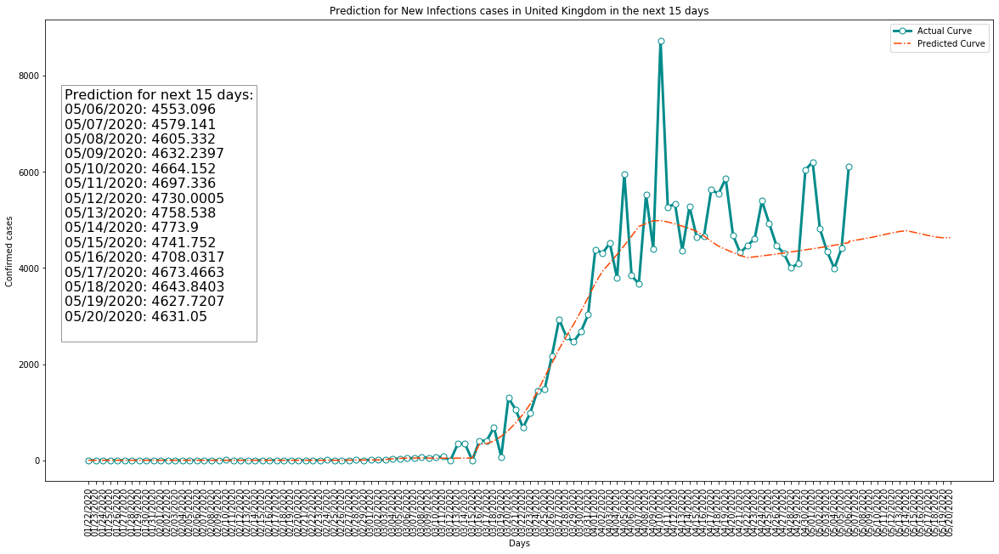

In [53]:
uk_infection_nn_model = models.load_model('uk_infection_model.h5')

covid_19_infections_per_day = covid_19_infections_per_day_last_week.copy().reset_index()

uk_actual_infections = covid_19_infections_per_day[covid_19_infections_per_day['Country'] == 'United Kingdom'].transpose()
uk_actual_infections = uk_actual_infections.reset_index().loc[1:,:]
uk_actual_infections.columns = ['Date', 'New Infections']
uk_actual_infections['Date'] = pd.to_datetime(uk_actual_infections['Date'])

plt_uk_infections = prediction_plot(uk_actual_infections, uk_infection_nn_model, type_string='New Infections',
                                   prediction_days=15, country='United Kingdom')

plt_uk_infections.show()

In [54]:
# Saving model for world confirmed predictions

#germany_infection_target_data = germany_infection_data + 1.

#display(germany_infection_target_data)

#y_confirmed = np.log10(germany_infection_target_data)

#display(y_confirmed)
#x_confirmed = np.arange(1, len(y_confirmed) + 1)

#epochs = 5000

#model.fit(x_confirmed.reshape(y_confirmed.shape[0],1), y_confirmed.reshape(y_confirmed.shape[0],1), epochs=epochs, batch_size=10)

#model.save('germany_infection_model.h5')

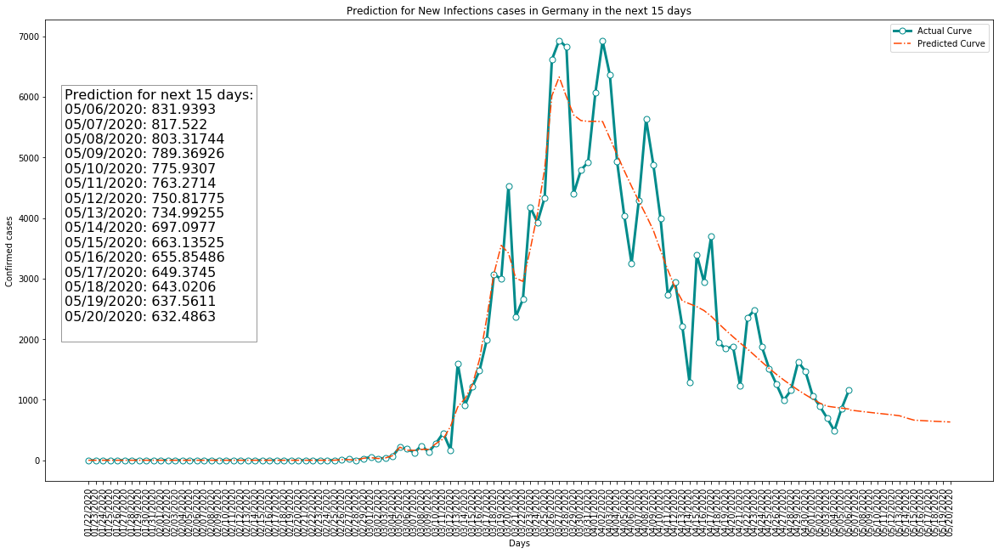

In [55]:
germany_infection_nn_model = models.load_model('germany_infection_model.h5')

covid_19_infections_per_day = covid_19_infections_per_day_last_week.copy().reset_index()

germany_actual_infections = covid_19_infections_per_day[covid_19_infections_per_day['Country'] == 'Germany'].transpose()
germany_actual_infections = germany_actual_infections.reset_index().loc[1:,:]
germany_actual_infections.columns = ['Date', 'New Infections']
germany_actual_infections['Date'] = pd.to_datetime(germany_actual_infections['Date'])

plt_germany_infections = prediction_plot(germany_actual_infections, germany_infection_nn_model, type_string='New Infections',
                                   prediction_days=15, country='Germany')

plt_germany_infections.show()